# Metodología de preprocesamiento, limpieza y calidad de datos

## Ciclo de vida de Construcción de un Modelo de Predicción

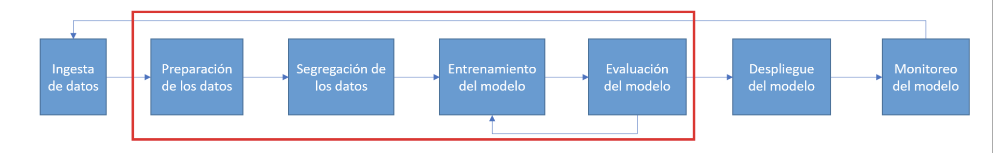

La etapa de **preparación de los datos** o conocida como **preprocesamiento de datos** típicamente es la etapa en la cual se invierte la mayor cantidad de tiempo en la construcción de un modelo de predicción. Según algunas estadísticas, esta etapa puede representar entre un 60% y 70% del tiempo total invertido en el desarrollo de un modelo.

El **preprocesado** engloba todas aquellas transformaciones realizadas sobre los datos con el objetivo que puedan ser interpretados por el algoritmo de Machine Learning lo más eficientemente posible. Todo este proceso debe aprenderse con aquellas observaciones de entrenamiento y luego ser aplicadas al conjunto de datos de entrenamiento y prueba.

## ¿Qué tareas se llevan a cabo en esta etapa?

1. `Data Cleaning`: Identificar y corregir errores presentes en los datos (registros duplicados, valores nulos, valores atítipos, entre otros).

2. `Data Transforms`: Cambiar la escala o distribución de las *features*.

3. `Feature Selection`: Identificar aquellas *features* que son más relevantes para la tarea de predicción.

4. `Feature Engineering`: Derivar nuevas *features* a partir de transformaciones realizadas a los datos disponibles.

5. `Dimensionality Reduction`: Reducir el número de *features* en la base de datos. 

## Información del dataset

**Contexto** \
Se cuenta con un conjunto de datos de muestra que resume el comportamiento de uso de aproximadamente 9000 titulares de tarjetas de crédito activos durante 6 meses. El archivo está a nivel de cliente con 18 variables de comportamiento.

| Feature                   | Descripción                      | Tipo     |
| :---                      | :----                            | ---:     |
| 1. **CUSTID**  | Identificación del titular de la tarjeta de crédito | Categórica  |
| 2. **BALANCE**  | Cantidad de saldo que queda en su cuenta para realizar compras | Númerico - Flotante   |
| 3. **BALANCE_FREQUENCY**     | Frecuencia de actualización del saldo, puntuación entre 0 y 1 (1 = actualizado con frecuencia, 0 = no actualizado con frecuencia)  | Númerico - Flotante  |
| 4. **PURCHASES**          |  Importe de las compras realizadas desde la cuenta     | Númerico - Flotante   |
| 5. **ONEOFF_PURCHASES**          | Cantidad máxima de compra realizada en una sola vez     | Númerico - Flotante |
| 6. **INSTALLMENTS_PURCHASES**          | Importe de la compra realizada a plazos     | Númerico - Flotante |
| 7. **CASH_ADVANCE**          | Anticipo dado por el usuario     | Númerico - Flotante  |
| 8. **PURCHASES_FREQUENCY**          | Frecuencia con la que se realizan las Compras, puntuación entre 0 y 1 (1 = compras frecuentes, 0 = compras no frecuentes)     | Númerico - Flotante  |
| 9. **ONEOFF_PURCHASES_FREQUENCY**          | Con qué frecuencia se realizan compras de una sola vez (1 = comprado con frecuencia, 0 = comprado con frecuencia)    | Númerico - Flotante  |
| 10. **PURCHASES_INSTALLMENTS_FREQUENCY**          | Con qué frecuencia se realizan las compras a plazos (1 = se realizan con frecuencia, 0 = no se realizan con frecuencia)     | Númerico - Flotante  |
| 11. **CASH_ADVANCE_FREQUENCY**          | Con qué frecuencia se paga el anticipo en efectivo |   Númerico - Flotante   |
| 12. **CASH_ADVANCE_TRX**          | Número de transacciones realizadas con "Avance de efecivo (Cash in Advanced)"    |  Númerico - Entero  |
| 13. **PURCHASES_TRX**         | Número de transacciones de compra realizadas     | Númerico - Entero |
| 14. **CREDIT_LIMIT**          | Límite de tarjeta de crédito para el usuario     | Númerico - Flotante  |
| 15. **PAYMENTS**          | Monto del pago realizado por el usuario  | Númerico - Flotante |
| 16. **MINIMUM_PAYMENTS**          | Cantidad mínima de pagos realizados por el usuario | Númerico - Flotante  |
| 17. **PRC_FULL_PAYMENT**          | Porcentaje del pago total pagado por el usuario | Númerico - Flotante
| 18. **TENURE**          | Tenencia del servicio de tarjeta de crédito para el usuario | Númerico - Entero

## Librerías y funciones

In [53]:
#Instalación de SweetVIZ para la visualización descriptiva de los datos
!pip install sweetviz

In [54]:
# Tratamiento de datos
import numpy as np
import pandas as pd
import math

# Gráficos
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import style
%matplotlib inline

# Estilos de las gráfica
plt.style.use('bmh') #makes plots look pretty

# Preprocesado y modelado
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.ensemble import IsolationForest
from sklearn.covariance import EllipticEnvelope
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM

# Escalado de datos
from sklearn.preprocessing import scale

# Configuración ignore warnings
import warnings
warnings.filterwarnings('ignore')

# SweetVIZ
import sweetviz as sv

In [55]:
sns.set()

## Análisis Exploratorio inicial

In [74]:
# lectura del dataset
data=pd.read_csv('CC GENERAL.csv', sep=',')

In [6]:
data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [56]:
data.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

In [57]:
data.head().T

,0,1,2,3,4
CUST_ID,C10001,C10002,C10003,C10004,C10005
BALANCE,40.900749,3202.467416,2495.148862,1666.670542,817.714335
BALANCE_FREQUENCY,0.818182,0.909091,1.0,0.636364,1.0
PURCHASES,95.4,0.0,773.17,1499.0,16.0
ONEOFF_PURCHASES,0.0,0.0,773.17,1443.5125,16.0
INSTALLMENTS_PURCHASES,95.4,0.0,0.0,0.0,0.0
CASH_ADVANCE,0.0,2784.552848,0.0,205.788017,0.0
PURCHASES_FREQUENCY,0.166667,0.0,1.0,0.083333,0.083333
ONEOFF_PURCHASES_FREQUENCY,0.0,0.0,0.75,0.083333,0.083333
PURCHASES_INSTALLMENTS_FREQUENCY,0.083333,0.0,0.0,0.0,0.0


In [8]:
# Tamaño del dataset
data.shape

(8950, 18)

In [9]:
# Identificamos el tipo de variable
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

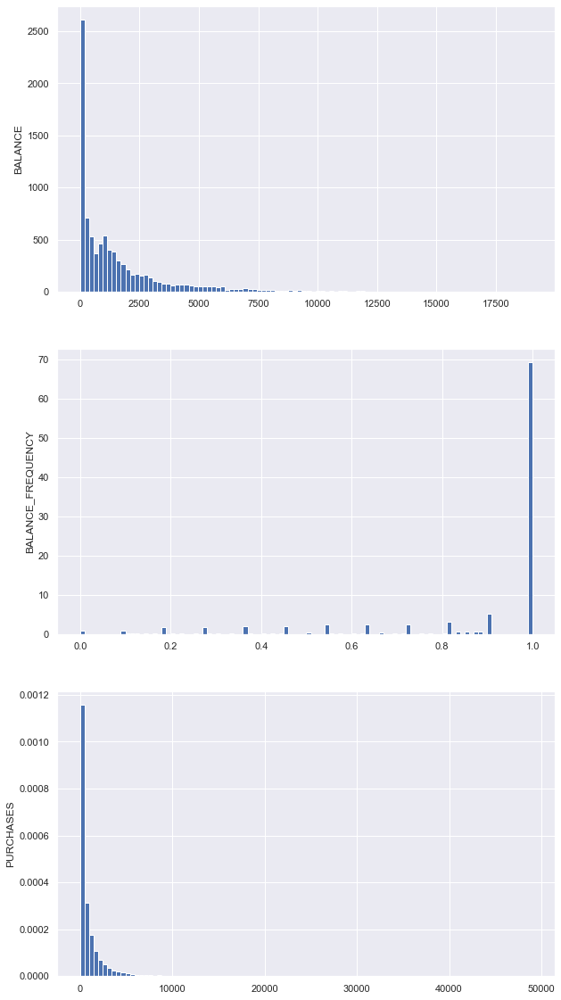

In [10]:
# Graficar multiples figuras en una misma celda de código utilizando Matplotlib

## Histogramas

f_dims = (10, 20)
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=f_dims)

ax1.hist(data['BALANCE'], bins=100)
ax1.set_ylabel('BALANCE')
               
ax2.hist(data['BALANCE_FREQUENCY'], density=True, bins=100)
ax2.set_ylabel('BALANCE_FREQUENCY')

ax3.hist(data['PURCHASES'], density=True, bins=100)
ax3.set_ylabel('PURCHASES')

plt.show()

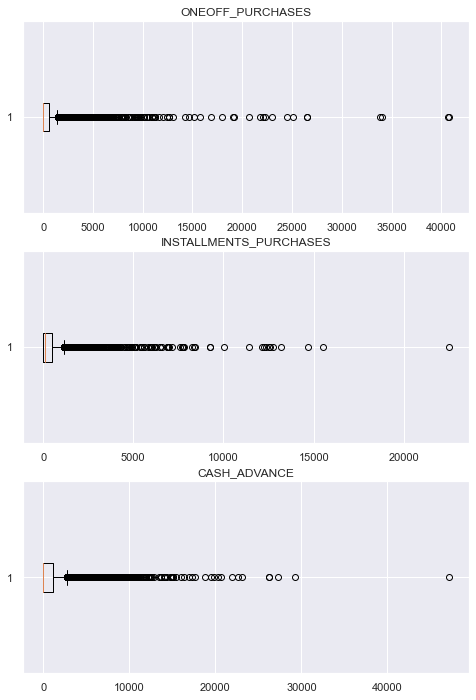

In [13]:
## Boxplots

f_dims = (8, 12)
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=f_dims)

ax1.boxplot(x=data['ONEOFF_PURCHASES'], vert=False)
ax1.set_title(label='ONEOFF_PURCHASES')

ax2.boxplot(x=data['INSTALLMENTS_PURCHASES'], vert=False)
ax2.set_title(label='INSTALLMENTS_PURCHASES')

ax3.boxplot(x=data['CASH_ADVANCE'], vert=False)
ax3.set_title(label='CASH_ADVANCE')

plt.show()

In [ ]:
## Scatterplots

f_dims = (10, 10)
fig, ax = plt.subplots(figsize=f_dims)

sns.scatterplot(data=data, x='BALANCE_FREQUENCY', y='PURCHASES_FREQUENCY', ax=ax, hue='TENURE')

<AxesSubplot:xlabel='BALANCE', ylabel='PAYMENTS'>

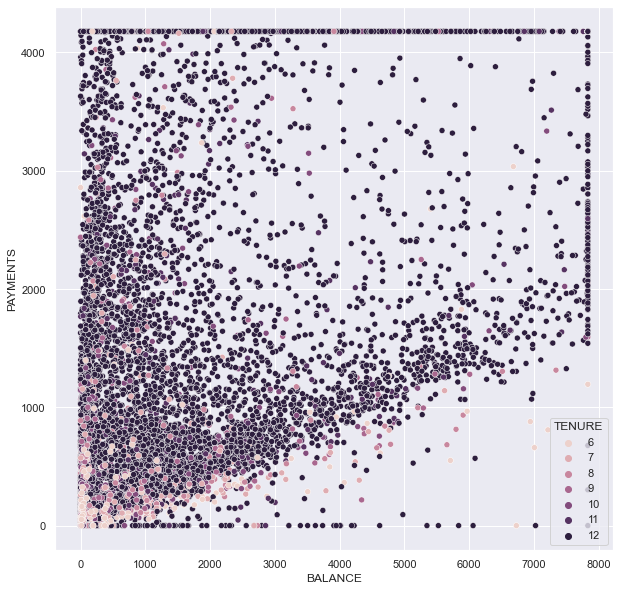

In [61]:
f_dims = (10, 10)
fig, ax = plt.subplots(figsize=f_dims)

sns.scatterplot(data=data, x='BALANCE', y='PAYMENTS', ax=ax, hue='TENURE')

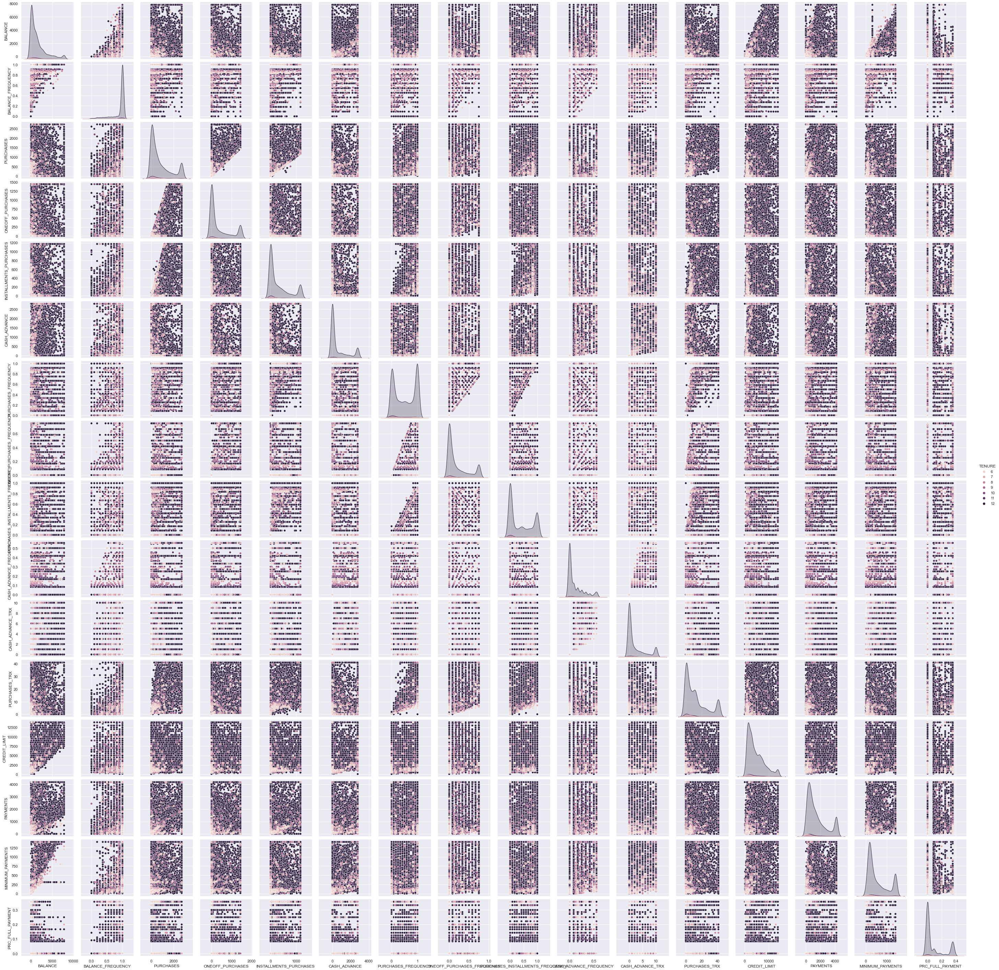

In [58]:
sns.pairplot(data, hue = 'TENURE')

In [18]:
data.TENURE.value_counts()

12    7584
11     365
10     236
6      204
8      196
7      190
9      175
Name: TENURE, dtype: int64

In [19]:
data.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


**Reporte** en SWETVIZ

In [62]:
my_report = sv.analyze(data.iloc[:,1:])
my_report.show_html() # Default arguments will generate to "SWEETVIZ_REPORT.html"

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



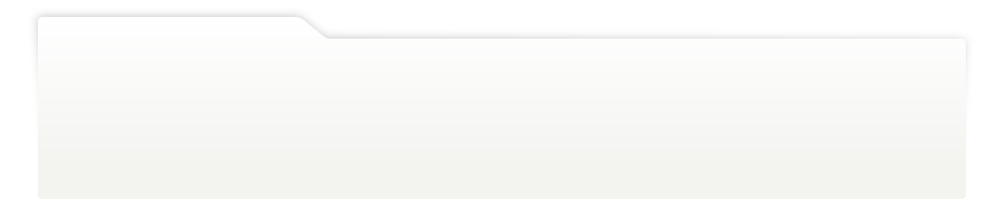
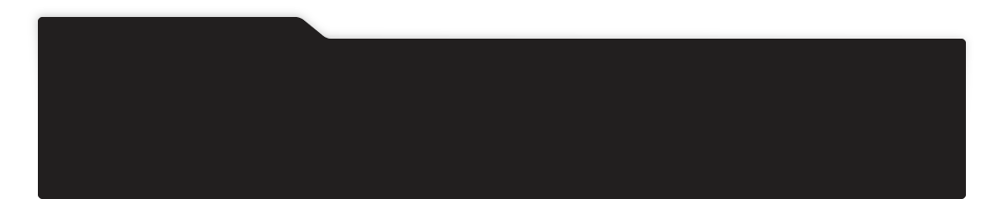
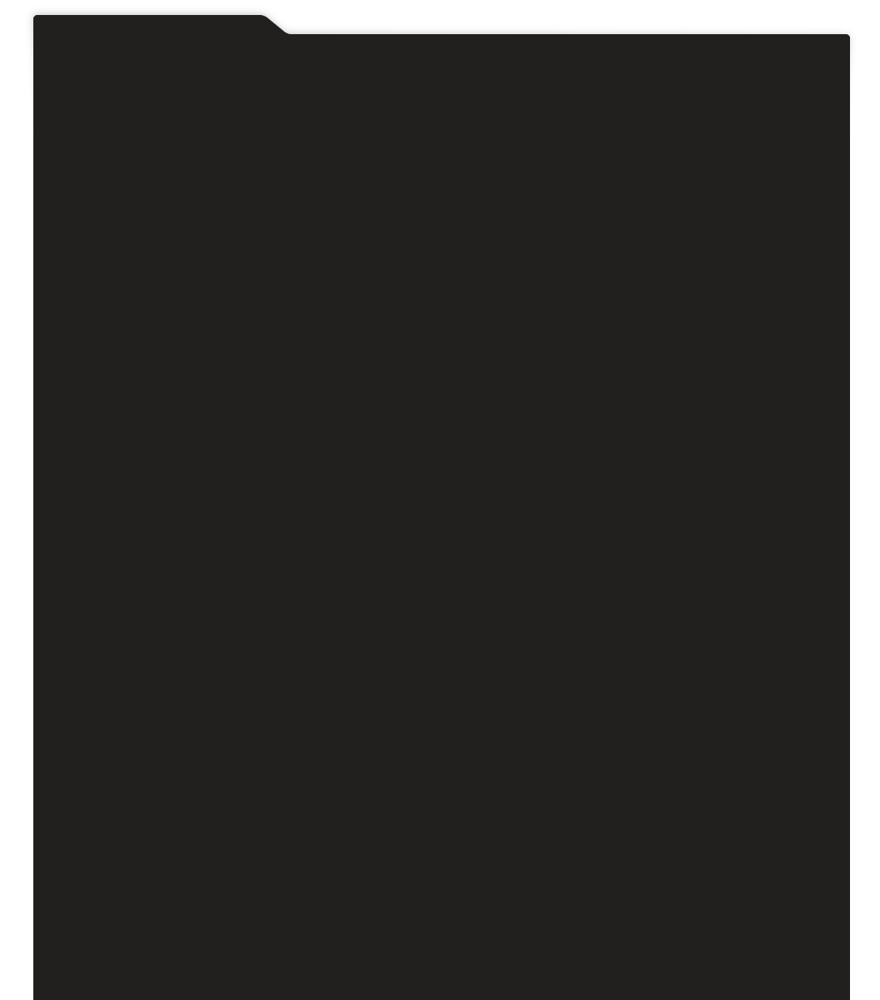
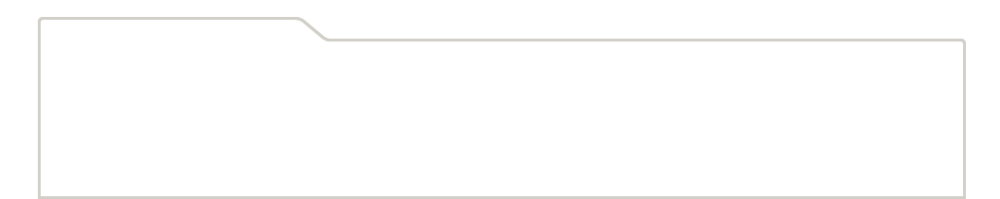
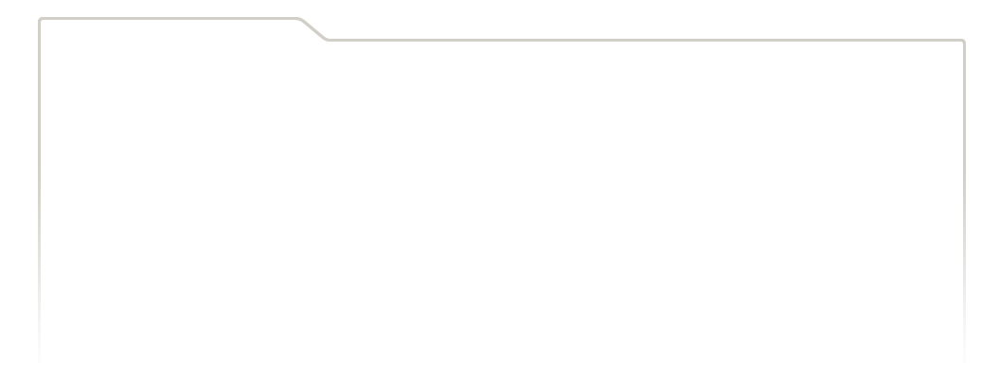
...
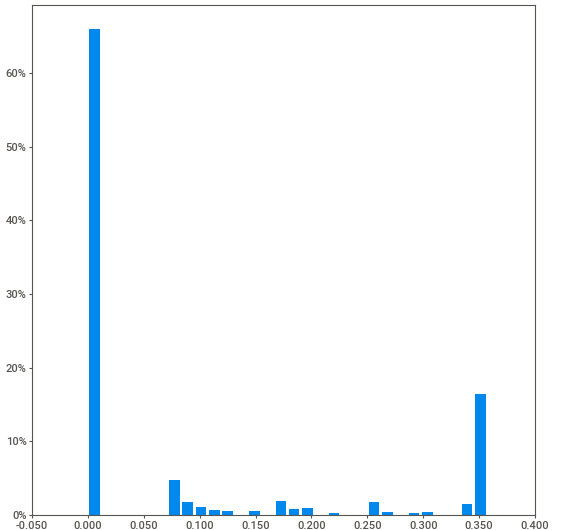
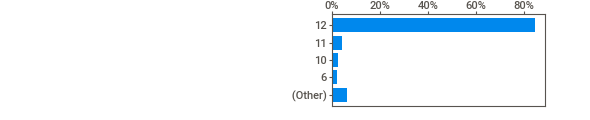
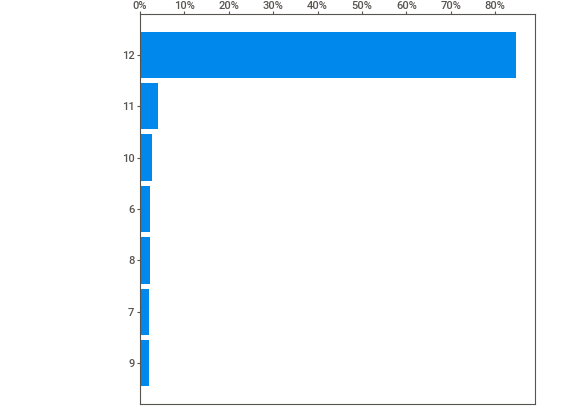
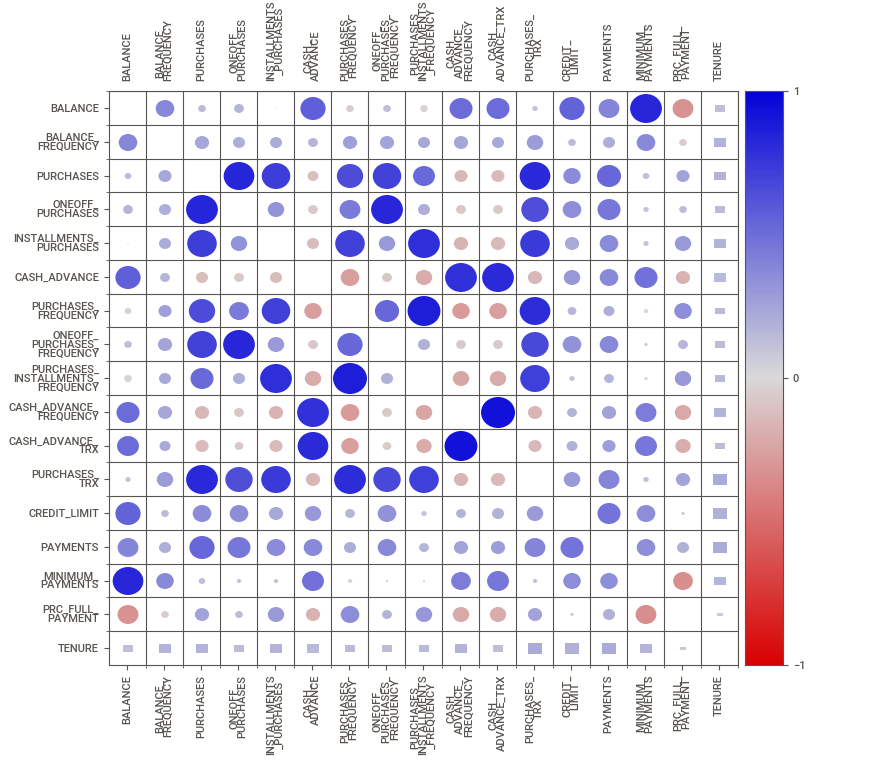
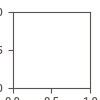

In [63]:
my_report.show_notebook(  w=None, 
                h=None, 
                scale=None,
                layout='vertical')

In [64]:
# Correlación lineal entre los datos
data.corr()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
BALANCE,1.000000,0.343652,0.099749,0.119939,0.021831,0.545398,-0.092910,0.078418,-0.078232,0.477282,0.484298,0.062005,0.526979,0.359331,0.820038,-0.381605,0.074155
BALANCE_FREQUENCY,0.343652,1.000000,0.198280,0.157486,0.172158,0.126291,0.229715,0.204099,0.176079,0.199814,0.186107,0.244463,0.102552,0.153270,0.336187,-0.101910,0.119776
PURCHASES,0.099749,0.198280,1.000000,0.830603,0.706135,-0.177093,0.631891,0.683525,0.488919,-0.207612,-0.190023,0.808546,0.330448,0.501153,0.078190,0.212936,0.120207
ONEOFF_PURCHASES,0.119939,0.157486,0.830603,1.000000,0.286764,-0.116870,0.408137,0.821933,0.152872,-0.127137,-0.117956,0.622341,0.321507,0.422124,0.061005,0.091038,0.087002
INSTALLMENTS_PURCHASES,0.021831,0.172158,0.706135,0.286764,1.000000,-0.185467,0.688315,0.249382,0.780193,-0.220042,-0.200208,0.725475,0.191961,0.324137,0.049529,0.254259,0.111298
CASH_ADVANCE,0.545398,0.126291,-0.177093,-0.116870,-0.185467,1.000000,-0.319499,-0.134830,-0.264589,0.769767,0.801425,-0.203801,0.258440,0.331303,0.449154,-0.227197,-0.099027
PURCHASES_FREQUENCY,-0.092910,0.229715,0.631891,0.408137,0.688315,-0.319499,1.000000,0.499498,0.862934,-0.336823,-0.315382,0.795194,0.118251,0.163930,-0.053862,0.316356,0.061506
ONEOFF_PURCHASES_FREQUENCY,0.078418,0.204099,0.683525,0.821933,0.249382,-0.134830,0.499498,1.000000,0.143475,-0.121845,-0.118664,0.650300,0.293041,0.336919,0.025432,0.123273,0.077257
PURCHASES_INSTALLMENTS_FREQUENCY,-0.078232,0.176079,0.488919,0.152872,0.780193,-0.264589,0.862934,0.143475,1.000000,-0.285161,-0.264110,0.700146,0.057795,0.120975,-0.030323,0.266671,0.073275
CASH_ADVANCE_FREQUENCY,0.477282,0.199814,-0.207612,-0.127137,-0.220042,0.769767,-0.336823,-0.121845,-0.285161,1.000000,0.930204,-0.217631,0.128296,0.213939,0.396505,-0.268737,-0.127145


In [66]:
corr_mat.shape

(17, 17)

In [16]:
# Pares de variables más correlacionadas entre si
corr_mat = data.corr()

for x in range(corr_mat.shape[0]):
    corr_mat.iloc[x,x] = 0.0
    
corr_mat.abs().idxmax()

BALANCE                                                 CREDIT_LIMIT
BALANCE_FREQUENCY                                            BALANCE
PURCHASES                                           ONEOFF_PURCHASES
ONEOFF_PURCHASES                                           PURCHASES
INSTALLMENTS_PURCHASES                                     PURCHASES
CASH_ADVANCE                                        CASH_ADVANCE_TRX
PURCHASES_FREQUENCY                 PURCHASES_INSTALLMENTS_FREQUENCY
ONEOFF_PURCHASES_FREQUENCY                             PURCHASES_TRX
PURCHASES_INSTALLMENTS_FREQUENCY                 PURCHASES_FREQUENCY
CASH_ADVANCE_FREQUENCY                              CASH_ADVANCE_TRX
CASH_ADVANCE_TRX                              CASH_ADVANCE_FREQUENCY
PURCHASES_TRX                                              PURCHASES
CREDIT_LIMIT                                                 BALANCE
PAYMENTS                                                   PURCHASES
MINIMUM_PAYMENTS                  

## 1. Data Cleaning

In [20]:
# Revisar el data type con el que fue cargado los datos y si hay presencia de valores nulos en alguna columna

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [21]:
# Otra forma de revisar el tipo de dato almacenado en el dataframe
data.dtypes

CUST_ID                              object
BALANCE                             float64
BALANCE_FREQUENCY                   float64
PURCHASES                           float64
ONEOFF_PURCHASES                    float64
INSTALLMENTS_PURCHASES              float64
CASH_ADVANCE                        float64
PURCHASES_FREQUENCY                 float64
ONEOFF_PURCHASES_FREQUENCY          float64
PURCHASES_INSTALLMENTS_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY              float64
CASH_ADVANCE_TRX                      int64
PURCHASES_TRX                         int64
CREDIT_LIMIT                        float64
PAYMENTS                            float64
MINIMUM_PAYMENTS                    float64
PRC_FULL_PAYMENT                    float64
TENURE                                int64
dtype: object

In [22]:
# Otra forma de revisar los valores nulos
data.isnull()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
8946,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False
8947,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
8948,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [23]:
data.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [24]:
data.isnull().sum()[data.isnull().sum() > 0]

CREDIT_LIMIT          1
MINIMUM_PAYMENTS    313
dtype: int64

In [25]:
# Obtener los registros en donde la varibale CREDIT_LIMIT está vacia

data[data['CREDIT_LIMIT'].isna()]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5203,C15349,18.400472,0.166667,0.0,0.0,0.0,186.853063,0.0,0.0,0.0,0.166667,1,0,NaN,9.040017,14.418723,0.0,6


In [26]:
# Obtener los registros en donde la varibale MINIMUM_PAYMENTS está vacia

data[data['MINIMUM_PAYMENTS'].isna()]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.0,12
45,C10047,2242.311686,1.000000,437.00,97.00,340.0,184.648692,0.333333,0.083333,0.333333,0.166667,2,5,2400.0,0.000000,NaN,0.0,12
47,C10049,3910.111237,1.000000,0.00,0.00,0.0,1980.873201,0.000000,0.000000,0.000000,0.500000,7,0,4200.0,0.000000,NaN,0.0,12
54,C10056,6.660517,0.636364,310.00,0.00,310.0,0.000000,0.666667,0.000000,0.666667,0.000000,0,8,1000.0,417.016763,NaN,0.0,12
55,C10057,1311.995984,1.000000,1283.90,1283.90,0.0,0.000000,0.250000,0.250000,0.000000,0.000000,0,6,6000.0,0.000000,NaN,0.0,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8919,C19160,14.524779,0.333333,152.00,152.00,0.0,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,1500.0,0.000000,NaN,0.0,6
8929,C19170,371.527312,0.333333,0.00,0.00,0.0,1465.407927,0.000000,0.000000,0.000000,0.166667,5,0,1500.0,0.000000,NaN,0.0,6
8935,C19176,183.817004,1.000000,465.90,0.00,465.9,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1500.0,0.000000,NaN,0.0,6
8944,C19185,193.571722,0.833333,1012.73,1012.73,0.0,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,4000.0,0.000000,NaN,0.0,6


### ¿Por qué es importante conocer si nuestra base de datos contiene columnas con valores vacíos?

La razón principal es que no todos los algoritmos de Machine Learning que han sido implementados en Python soportan que la base de datos de entrada (input data) contenga columnas con valores vacios. Por lo cual, si al momento de entrenar un modelo la base de datos de entrada contiene valores vacios, nos va a retornar un error y no se realizará el entrenamiento.

### ¿Cómo solucionamos el problema de valores vacios (null values)?

1. Eliminar los registros que contienen los datos vacios. Esto se realiza con la función [pandas.DataFrame.dropna()](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.dropna.html)

In [27]:
data_dropna = data.dropna()

In [29]:
print('Número de filas con valores vacios: ', len(data), 
      '\nNúmero de filas luego de valores vacios removidos: ', len(data_dropna))

Número de filas con valores vacios:  8950 
Número de filas luego de valores vacios removidos:  8636


In [31]:
data_dropna[data_dropna['CREDIT_LIMIT'].isna()]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE


In [30]:
data_dropna[data_dropna['MINIMUM_PAYMENTS'].isna()]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE


2. Utilizar una técnica de llenado de datos que se conoce como **Imputing Missing Values**. Esta técnica consiste en usar una estrategia para reemplazar los valores vacios, por ejemplo:

- Utilizar un valor constante.
- Utilizar la media, mediana, moda de la distribución de los datos de la columna.
- Seleccionado aleatoriamente un valor del conjunto de datos de la columna.
- Estimar un valor a partir de un modelo predictivo.

In [45]:
data.median()

BALANCE                              873.385231
BALANCE_FREQUENCY                      1.000000
PURCHASES                            361.280000
ONEOFF_PURCHASES                      38.000000
INSTALLMENTS_PURCHASES                89.000000
CASH_ADVANCE                           0.000000
PURCHASES_FREQUENCY                    0.500000
ONEOFF_PURCHASES_FREQUENCY             0.083333
PURCHASES_INSTALLMENTS_FREQUENCY       0.166667
CASH_ADVANCE_FREQUENCY                 0.000000
CASH_ADVANCE_TRX                       0.000000
PURCHASES_TRX                          7.000000
CREDIT_LIMIT                        3000.000000
PAYMENTS                             856.901546
MINIMUM_PAYMENTS                     312.343947
PRC_FULL_PAYMENT                       0.000000
TENURE                                12.000000
dtype: float64

In [68]:
data.mean()

BALANCE                             1517.851008
BALANCE_FREQUENCY                      0.877271
PURCHASES                            737.149330
ONEOFF_PURCHASES                     354.358139
INSTALLMENTS_PURCHASES               295.546214
CASH_ADVANCE                         672.468924
PURCHASES_FREQUENCY                    0.490351
ONEOFF_PURCHASES_FREQUENCY             0.184773
PURCHASES_INSTALLMENTS_FREQUENCY       0.364437
CASH_ADVANCE_FREQUENCY                 0.126061
CASH_ADVANCE_TRX                       2.383128
PURCHASES_TRX                         11.623799
CREDIT_LIMIT                        4419.137221
PAYMENTS                            1347.084165
MINIMUM_PAYMENTS                     520.993654
PRC_FULL_PAYMENT                       0.087223
TENURE                                11.517318
dtype: float64

In [44]:
data_fill_na = data.fillna(data.median())
data_fill_na.isnull().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

Para los tres primeros casos la tarea se puede llevar a cabo con la función [sklearn.impute.SimpleImputer()](https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html#sklearn-impute-simpleimputer) del modulo *Impute* del paquete de **Scikit Learn**

In [75]:
# Para esto debo separar los features de la target y almacenarlas en arreglos matriciales de numpy
# debido a que el imputer solo recibe como input un array.

## Obteniendo los features
X_names = list(data.columns)[:-1]
X = data.drop(labels='TENURE', axis=1).to_numpy()

## Obteniendo la target
y = data['TENURE'].to_numpy()

In [76]:
X_names

['CUST_ID',
 'BALANCE',
 'BALANCE_FREQUENCY',
 'PURCHASES',
 'ONEOFF_PURCHASES',
 'INSTALLMENTS_PURCHASES',
 'CASH_ADVANCE',
 'PURCHASES_FREQUENCY',
 'ONEOFF_PURCHASES_FREQUENCY',
 'PURCHASES_INSTALLMENTS_FREQUENCY',
 'CASH_ADVANCE_FREQUENCY',
 'CASH_ADVANCE_TRX',
 'PURCHASES_TRX',
 'CREDIT_LIMIT',
 'PAYMENTS',
 'MINIMUM_PAYMENTS',
 'PRC_FULL_PAYMENT']

In [77]:
X

array([['C10001', 40.900749, 0.818182, ..., 201.802084, 139.509787, 0.0],
       ['C10002', 3202.467416, 0.909091, ..., 4103.032597, 1072.340217,
        0.222222],
       ['C10003', 2495.148862, 1.0, ..., 622.066742, 627.284787, 0.0],
       ...,
       ['C19188', 23.398673, 0.833333, ..., 81.270775, 82.418369, 0.25],
       ['C19189', 13.457564, 0.833333, ..., 52.549959, 55.755628, 0.25],
       ['C19190', 372.708075, 0.666667, ..., 63.165404, 88.288956, 0.0]],
      dtype=object)

In [78]:
X.shape

(8950, 17)

In [79]:
### Realizando el llenado de los valores vacios con una constante

imp = SimpleImputer(strategy='constant', fill_value=0)
data_fill_const = imp.fit_transform(X)
pd.DataFrame(data_fill_const, columns=X_names).isnull().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
dtype: int64

In [81]:
for row in pd.DataFrame(data_fill_const, columns=X_names)['MINIMUM_PAYMENTS']:
    print(row)

139.509787
1072.340217
627.284787
0
244.791237
2407.246035
198.065894
532.03399
311.963409
100.302262
2172.697765
155.549069
490.207013
251.137986
989.962866
2109.90649
376.579631
73.203221
744.613395
12465.54938
13557.29726
1659.775075
86.329554
1425.426525
1657.002877
163.005536
971.183209
164.748819
1648.851345
159.684442
3292.01503
256.848991
2506.745366
196.301885
17862.55831
634.569311
1986.843608
1541.141605
2049.408839
719.948985
283.333445
363.142736
1801.264841
321.354137
1318.71492
0
147.199792
0
175.657825
286.448719
1012.415961
1322.446601
581.481917
132.446091
0
0
0
1311.514878
1600.212243
1895.02617
548.105836
837.215674
241.645387
0
3266.996777
897.905444
179.412493
352.883804
1001.607366
923.505868
2180.881868
1107.030803
140.983193
622.757696
175.510344
2161.428274
623.656993
190.186542
8242.687678
2503.40234
121.523416
164.692136
99.533735
140.809454
594.756686
171.357189
1876.262988
2074.581541
968.941265
2864.380327
9827.045323
910.707525
312.560636
0
0
2906.110765

152.106855
1587.042735
178.06847
1112.634979
27146.02678
1027.885496
173.322076
1718.363679
160.071637
1032.384353
1207.117316
1573.961394
70.583398
271.90089
194.55397
57.545594
190.875362
12256.99852
9627.891511
503.399492
2172.302786
2345.198755
1076.334465
561.918093
582.489074
1322.868997
685.995885
348.943877
192.561842
752.616787
336.823302
2739.343539
183.380543
1329.881951
41.026459
635.401109
173.484575
250.283276
74.878694
1285.667565
185.380301
2658.139243
1121.296235
1818.148035
163.367227
239.523143
0
83.449559
203.356235
183.138427
130.626533
416.325411
204.88001
665.357143
148.644436
159.496615
444.684235
1637.629006
436.577474
244.624549
284.024015
897.29515
1192.462873
141.256176
101.418698
174.477061
157.872552
2996.008935
174.261548
164.071552
1566.969659
0
2469.589072
177.969765
167.998751
299.249818
1229.779536
1070.026829
1102.402301
601.656779
3364.021248
1168.006176
143.808363
2019.019279
333.50034
166.497851
352.090849
9957.74274
2621.071099
6422.472544
1433.7

123.424741
10474.56452
242.240752
53.294711
467.183345
1103.84347
404.810009
168.184085
191.993448
0
988.843416
124.816467
122.83519
118.67516
206.505497
90.167861
135.328767
121.14295
545.158224
456.289689
828.828133
169.684838
910.942173
988.159544
194.901529
283.339719
17.053725
1076.539881
1131.579706
149.956376
707.607834
0
277.826134
197.087803
144.531014
1484.636709
1746.510786
1157.178012
117.664686
135.178047
48.96697
489.267058
1281.843775
168.430684
252.187792
165.877993
229.880036
760.852947
237.035886
171.958681
462.098001
1337.235636
249.103542
110.712542
1607.124085
211.836739
327.217973
1696.945451
938.210823
649.808406
604.704131
171.747655
636.954252
623.12516
0
2746.592199
456.099234
404.839423
1093.331983
284.390966
432.987767
385.183578
262.826661
174.81905
1458.898338
16.853858
200.078137
340.000899
108.486655
2284.360915
967.565584
767.438566
1333.818771
160.909873
290.544441
704.457126
202.802547
205.19717
440.543925
222.642044
1970.75409
47.739871
232.12183
262

19.703002
58.816069
178.977455
214.062758
129.984016
350.033702
184.288462
1033.145181
111.894178
180.637896
232.49717
610.251148
103.701385
657.600716
158.020499
255.621363
176.889617
475.89936
316.380664
1744.975926
1233.962964
140.547255
179.604687
178.537408
113.606953
571.995314
622.671345
274.065414
817.36242
182.922865
437.211705
22011.7798
953.264819
248.178351
302.127133
1129.747227
2275.686103
355.284593
94.668806
155.337674
908.384613
385.314668
252.062796
492.851078
133.319408
152.507474
316.758371
169.006513
2295.921053
302.481716
452.085171
507.068261
5624.605818
318.793218
377.084941
389.155496
14437.12209
169.807651
144.25972
139.047088
718.578894
1910.925633
19.582178
382.36978
454.665216
333.092064
228.297707
132.494842
434.513783
1475.203723
139.382867
231.513272
174.363145
437.099794
458.501302
715.509134
384.155979
183.469161
0
920.718093
211.611083
137.788624
398.734242
977.712784
173.016455
126.406004
1124.614121
849.355936
119.880198
1428.029439
4653.581451
307.

575.913224
99.565218
316.534888
0
78.504927
904.654686
1401.967646
334.274864
214.399847
273.52542
77.553281
189.618452
768.267252
168.037964
210.567593
171.92066
724.601528
166.39765
376.80756
1172.021803
467.263413
86.813318
4738.971247
162.034789
98.617471
170.326506
129.312379
596.988355
0
149.507563
1926.017588
185.947547
44.570781
326.953822
888.371377
563.475533
2549.226889
88.853589
165.044111
643.861607
178.035597
577.733132
504.64823
111.928897
45.155492
197.915029
202.790825
151.01851
11.802831
0
207.003426
1032.599236
330.293724
975.830612
86.959785
462.78765
442.992384
1008.776986
14.45821
362.428606
185.615564
882.951164
398.248053
0.319475
574.750942
170.018992
171.049246
1749.680157
646.089964
2439.310585
719.810646
812.598903
171.520002
1154.029789
163.608183
332.440855
116.628448
215.790698
915.672534
54.690715
232.626904
176.843605
127.210691
153.303679
342.36985
207.790429
113.721974
204.316917
204.400186
135.58233
859.154662
768.936115
9299.951204
86.6785
353.21570

In [82]:
### Realizando el llenado de los valores vacios con la moda de los datos de la columna

imp = SimpleImputer(strategy='most_frequent')
data_fill_moda = imp.fit_transform(X)
pd.DataFrame(data_fill_moda, columns=X_names).isnull().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
dtype: int64

In [83]:
pd.DataFrame(data_fill_moda, columns=X_names)['CREDIT_LIMIT'].mode(dropna=False)

0    3000.0
dtype: object

In [84]:
for row in pd.DataFrame(data_fill_moda, columns=X_names)['CREDIT_LIMIT']:
    print(row)

1000.0
7000.0
7500.0
7500.0
1200.0
1800.0
13500.0
2300.0
7000.0
11000.0
1200.0
2000.0
3000.0
7500.0
3000.0
8000.0
3000.0
2500.0
13000.0
4000.0
2000.0
11250.0
1800.0
9000.0
6000.0
3000.0
1700.0
1000.0
10500.0
6900.0
13000.0
6000.0
10500.0
1200.0
11000.0
1800.0
9000.0
5000.0
9000.0
7500.0
1800.0
3000.0
4500.0
1500.0
8500.0
2400.0
1700.0
4200.0
3300.0
4000.0
12000.0
2500.0
3500.0
3000.0
1000.0
6000.0
4000.0
7500.0
4000.0
6000.0
6500.0
1600.0
4150.0
1600.0
1850.0
1800.0
1500.0
2500.0
6000.0
1700.0
6250.0
7000.0
7000.0
2250.0
6000.0
6000.0
11000.0
1500.0
1200.0
7000.0
5000.0
9500.0
12000.0
1200.0
9000.0
16500.0
11000.0
13500.0
4500.0
6500.0
9000.0
4000.0
1800.0
2400.0
2400.0
1200.0
6000.0
4000.0
7000.0
3000.0
1500.0
2000.0
5700.0
4500.0
4000.0
4000.0
2500.0
8000.0
2000.0
9000.0
5500.0
4200.0
8500.0
7000.0
5000.0
3000.0
6500.0
1800.0
7000.0
3000.0
17000.0
9000.0
8500.0
3200.0
19000.0
2800.0
1200.0
5000.0
17000.0
13000.0
5000.0
5000.0
3000.0
13000.0
4000.0
2000.0
17000.0
1200.0
18000.0
2500.0

3666.666667
7500.0
7500.0
15000.0
200.0
1000.0
8500.0
3000.0
8500.0
1700.0
12500.0
9000.0
5000.0
7000.0
1200.0
2100.0
1500.0
6000.0
2500.0
7500.0
2500.0
2000.0
6500.0
4000.0
9500.0
12500.0
9100.0
1500.0
7500.0
3000.0
3000.0
4500.0
12000.0
10000.0
2500.0
4000.0
3500.0
9000.0
1000.0
1600.0
3000.0
1800.0
2100.0
3700.0
7500.0
1500.0
7100.0
1600.0
1500.0
18000.0
10000.0
1950.0
11000.0
11000.0
1800.0
14000.0
1200.0
4200.0
3000.0
1000.0
8500.0
4750.0
4500.0
8000.0
15000.0
10000.0
11000.0
3900.0
7000.0
10000.0
1500.0
3500.0
1000.0
8000.0
7500.0
11000.0
7500.0
4000.0
4000.0
7500.0
2000.0
2300.0
16000.0
7000.0
1500.0
4500.0
1800.0
7500.0
4500.0
5000.0
1200.0
1000.0
1200.0
2500.0
6000.0
5000.0
2000.0
6000.0
1500.0
4500.0
11500.0
300.0
9500.0
8000.0
11000.0
3000.0
1800.0
8000.0
1500.0
1200.0
3000.0
10000.0
5500.0
1600.0
9000.0
1500.0
7000.0
6000.0
5000.0
6500.0
2500.0
4000.0
1200.0
9500.0
3000.0
2500.0
10000.0
4500.0
10500.0
12000.0
6500.0
6000.0
7500.0
2500.0
1200.0
10100.0
4500.0
12500.0
6500.0


6000.0
4500.0
1200.0
2500.0
2000.0
1200.0
4000.0
7000.0
10000.0
6000.0
7000.0
11000.0
6500.0
1400.0
11500.0
5500.0
3000.0
2300.0
1500.0
3000.0
9000.0
6300.0
13500.0
1400.0
7000.0
2500.0
5500.0
1200.0
5000.0
6500.0
6500.0
1600.0
1500.0
4000.0
2500.0
1500.0
1200.0
12000.0
4000.0
1200.0
3000.0
4000.0
6500.0
6000.0
6000.0
1700.0
3000.0
1500.0
4000.0
10500.0
7500.0
1000.0
6000.0
6000.0
5000.0
8500.0
8500.0
5000.0
4650.0
11500.0
9000.0
10000.0
7000.0
4500.0
1200.0
6000.0
5000.0
13500.0
8000.0
17500.0
6000.0
5000.0
7500.0
1500.0
2500.0
6000.0
3000.0
1500.0
6000.0
1500.0
12500.0
15000.0
16500.0
9000.0
1000.0
6000.0
11000.0
1500.0
3000.0
7000.0
3500.0
3000.0
2000.0
3000.0
4500.0
2600.0
9000.0
3000.0
7100.0
3000.0
16500.0
500.0
4500.0
4000.0
7800.0
1200.0
6000.0
5000.0
3000.0
3000.0
9000.0
2900.0
1700.0
3000.0
1800.0
18000.0
2500.0
4500.0
3000.0
1500.0
3000.0
2500.0
11500.0
1000.0
1000.0
2500.0
2500.0
7500.0
7500.0
6500.0
3000.0
3000.0
1500.0
1200.0
5500.0
3000.0
1200.0
4500.0
3000.0
6000.0
1200

10000.0
2500.0
7000.0
3000.0
6600.0
5500.0
6000.0
6200.0
2200.0
4500.0
6000.0
8000.0
1500.0
700.0
600.0
1500.0
4500.0
300.0
3000.0
1500.0
11000.0
2000.0
1500.0
2500.0
3000.0
5000.0
5500.0
2900.0
1500.0
3500.0
14500.0
1500.0
1700.0
1200.0
1200.0
2000.0
7000.0
1200.0
9500.0
4000.0
1200.0
1500.0
2500.0
2000.0
3500.0
5000.0
9000.0
2150.0
2500.0
1700.0
3000.0
6000.0
6500.0
7000.0
8000.0
7000.0
3000.0
3000.0
4000.0
4000.0
4500.0
6500.0
6500.0
2000.0
1200.0
3000.0
1200.0
2000.0
1500.0
8000.0
1800.0
1200.0
3500.0
3000.0
7000.0
600.0
4000.0
3000.0
2500.0
4200.0
1500.0
2500.0
8000.0
500.0
1000.0
7000.0
3500.0
5000.0
1800.0
10000.0
8500.0
1200.0
4500.0
5700.0
8000.0
5450.0
2500.0
1000.0
9000.0
3000.0
3000.0
1500.0
1500.0
4000.0
2400.0
8000.0
17500.0
2500.0
1500.0
9000.0
5000.0
2500.0
800.0
6000.0
5000.0
500.0
3500.0
5000.0
5000.0
8000.0
3000.0
6000.0
3000.0
1000.0
2000.0
2500.0
4500.0
1700.0
1000.0
5000.0
4000.0
1700.0
3500.0
1200.0
2500.0
1500.0
2500.0
3000.0
6000.0
2500.0
2500.0
2500.0
1000.0
2

2000.0
2500.0
2500.0
1000.0
500.0
2500.0
5000.0
3500.0
6500.0
3600.0
1200.0
4500.0
4000.0
2500.0
3000.0
6000.0
1200.0
1200.0
2500.0
1200.0
2500.0
4000.0
1500.0
3000.0
1000.0
1000.0
500.0
1500.0
1200.0
2000.0
1500.0
9000.0
2500.0
1200.0
4000.0
1200.0
2500.0
500.0
6500.0
3000.0
1200.0
1000.0
3000.0
1000.0
2000.0
5400.0
10500.0
1000.0
1000.0
1000.0
2700.0
500.0
2000.0
3000.0
2700.0
1000.0
1500.0
2000.0
2500.0
1500.0
4000.0
4000.0
2500.0
2500.0
2000.0
1200.0
1000.0
3000.0
3500.0
5000.0
9000.0
6000.0
6000.0
1500.0
2500.0
1000.0
4000.0
1500.0
2700.0
3000.0
1000.0
5500.0
1000.0
3000.0
3200.0
1500.0
1000.0
4000.0
1000.0
7500.0
3000.0
2000.0
7000.0
1200.0
2700.0
4000.0
5000.0
2500.0
4000.0
1200.0
1200.0
2700.0
4000.0
1500.0
4000.0
1200.0
1000.0
2500.0
1000.0
1800.0
1300.0
4000.0
7500.0
500.0
1000.0
1500.0
4000.0
3000.0
1000.0
1000.0
1000.0
1700.0
1500.0
1700.0
500.0
2500.0
3000.0
10000.0
3500.0
1500.0
17500.0
6500.0
1200.0
2000.0
1000.0
1200.0
1000.0
4000.0
1000.0
4000.0
1500.0
4000.0
1000.0
10

In [85]:
### Realizando el llenado de los valores vacios con la media de los datos de la columna

imp = SimpleImputer(strategy='mean')
data_fill_mean = imp.fit_transform(X)
pd.DataFrame(data_fill_mean, columns=X_names).isnull().sum()

ValueError: Cannot use mean strategy with non-numeric data:
could not convert string to float: 'C10001'

In [86]:
### Realizando el llenado de los valores vacios con la mediana de los datos de la columna

imp = SimpleImputer(strategy='median')
data_fill_median = imp.fit_transform(X)
pd.DataFrame(data_fill_median, columns=X_names).isnull().sum()

ValueError: Cannot use median strategy with non-numeric data:
could not convert string to float: 'C10001'

**Nota:** El `SimpleImputer` arroja un ValueError para las estrategias de *mean* y *median* debido a que este tipo de estrategías requieren que el conjunto de datos ingresados sean valores numéricos.

¿Cómo solucionarlo? -> Codificando las columnas de texto y de tipo fecha (datetime, timestamp) en valores numéricos. 

A la técnica de codificar variables categóricas en numéricas se le conoce como **Encoding Categorical Variables** y a la técnica de obtener nuevas variables de las ya existentes se le conoce como **Feature Engineering**.Adicionalmente al problema anterior,  se le suma que para algunos algoritmos de Machine Learning se requiere que la input data contenga todas las variables numéricas con lo cual lo anterior es un paso necesario que hay que llevar a cabo si en nuestra base de datos contamos con variables categóricas y variables tipo fecha. 

Existen algunas estrategías para codificar variables categóricas en numéricas:

- Dummies de pandas
- Ordinal Encoding.
- One Hot Encoding.

Estas estrategias se puede realizar con las funciones [pandas.get_dummies()](https://pandas.pydata.org/docs/reference/api/pandas.get_dummies.html), [sklearn.preprocessing.OrdinalEncoder()](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OrdinalEncoder.html#sklearn.preprocessing.OrdinalEncoder) y [sklearn.preprocessing.OneHotEncoder()](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html#sklearn.preprocessing.OneHotEncoder), respectivamente.

Para mas información visitar [Ordinal and One-Hot Encodings for Categorical Data](https://machinelearningmastery.com/one-hot-encoding-for-categorical-data/)

### Feature engineering

### 1.1 Revisar la existencia de registros duplicados 

In [87]:
data.duplicated().sum()

0

In [ ]:
#En caso de tener registros duplicados, pueden ser eliminados
data.drop_duplicates()

En caso de que se presenten filas duplicadas en un conjunto de datos, se procede a eliminar aquellos
registros duplicados. Esta tarea se puede hacer utilizando el método [pandas.DataFrame.dop_duplicates()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop_duplicates.html?highlight=drop_duplicates#pandas.DataFrame.drop_duplicates)


### 1.2 Revisar y 'eliminar' valores atípicos (Outliers)

Los Outlier son observaciones que están muy alejadas de la distribución central de los datos. Tener en cuenta este tipo de observaciones para entrenar un modelo de Machine Learning introduce sesgos en el aprendizaje. La decisión de remover este tipo de observaciones va a depender del contexto del problema que estamos trabajando.

Existen diferentes métodos para detectar outlier:

- Standard Deviation Method.
- Interquartile Range Method.
- Automatic Outlier Detection (One-Class Calssification):
    - Isolation Forest [sklearn.ensemble.IsolationForest()](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.IsolationForest.html)
    - Minimum Covariance Determinant [sklearn.covariance.EllipticEnvelope](https://scikit-learn.org/stable/modules/generated/sklearn.covariance.EllipticEnvelope.html)
    - Local Outlier Factor [sklearn.neighbors.LocalOutlierFactor](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.LocalOutlierFactor.html)
    - One-Class SVM [sklearn.svm.OneClassSVM](https://scikit-learn.org/stable/modules/generated/sklearn.svm.OneClassSVM.html#sklearn-svm-oneclasssvm)
    

<AxesSubplot:>

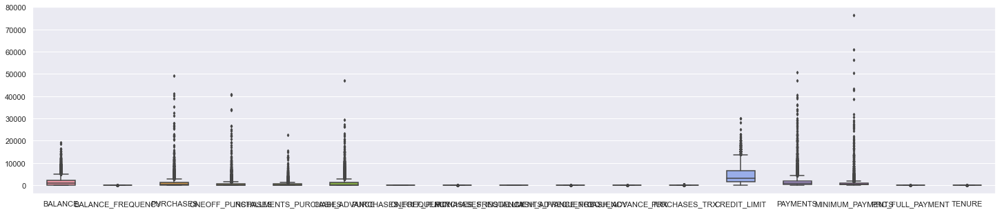

In [47]:
fig, ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data, width= 0.5,ax=ax,  fliersize=3)

<AxesSubplot:xlabel='TENURE'>

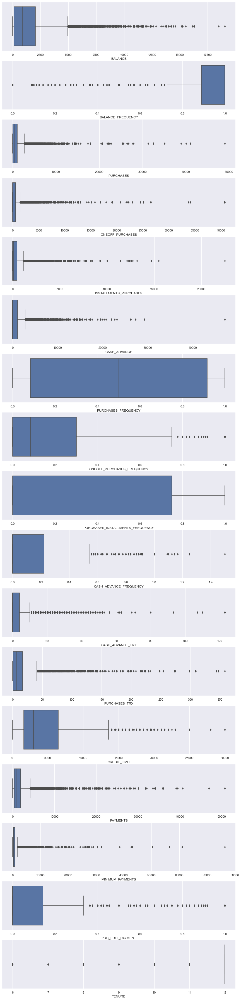

In [49]:
plt.rcParams['figure.figsize'] = (15,65)
fig, axs = plt.subplots(17, 1)

sns.boxplot(ax=axs[0], x=data.BALANCE)
sns.boxplot(ax=axs[1], x=data.BALANCE_FREQUENCY)
sns.boxplot(ax=axs[2], x=data.PURCHASES)
sns.boxplot(ax=axs[3], x=data.ONEOFF_PURCHASES)
sns.boxplot(ax=axs[4], x=data.INSTALLMENTS_PURCHASES)
sns.boxplot(ax=axs[5], x=data.CASH_ADVANCE)
sns.boxplot(ax=axs[6], x=data.PURCHASES_FREQUENCY)
sns.boxplot(ax=axs[7], x=data.ONEOFF_PURCHASES_FREQUENCY)
sns.boxplot(ax=axs[8], x=data.PURCHASES_INSTALLMENTS_FREQUENCY)
sns.boxplot(ax=axs[9], x=data.CASH_ADVANCE_FREQUENCY)
sns.boxplot(ax=axs[10], x=data.CASH_ADVANCE_TRX)
sns.boxplot(ax=axs[11], x=data.PURCHASES_TRX)
sns.boxplot(ax=axs[12], x=data.CREDIT_LIMIT)
sns.boxplot(ax=axs[13], x=data.PAYMENTS)
sns.boxplot(ax=axs[14], x=data.MINIMUM_PAYMENTS)
sns.boxplot(ax=axs[15], x=data.PRC_FULL_PAYMENT)
sns.boxplot(ax=axs[16], x=data.TENURE)

In [50]:
data.describe([.01,.1,.2,.3,.4,.5,.6,.7,.8,.9,.975])

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.282473,1733.143852,844.906767,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.646702,2895.063757,2332.792322,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
1%,0.065101,0.090909,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,500.000000,0.000000,20.040613,0.000000,6.000000
10%,23.575529,0.454545,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1200.000000,179.617069,109.131328,0.000000,10.000000
20%,77.238026,0.818182,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1500.000000,313.141031,157.390750,0.000000,12.000000
30%,207.176552,0.909091,89.285000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,2000.000000,459.438287,181.647737,0.000000,12.000000
40%,467.021989,1.000000,212.850000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,4.000000,2500.000000,624.268198,227.692134,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000


**TRATAMIENTO DE OUTLIERS**

Como la intención para realizar la agrupación o clusterización es por medio de la metodología de K-means, hay que tener presente que esta es susceptible a datos atípicos. Cómo equipo analítico, desde la información que tenemos del problema, tomamos la decisión de realizar una imputación a los valores atípicos, asignándole un valor por defecto. Este valor lo tomamos basados en la construcción del boxplot, en donde determina que un dato se considera outlier en el límite superior si se cumple que: 
$$ Lim_Sup = Cuartil_3 + 1.5 * IQR $$ 
Por lo tanto, para cada una de las variables se calcula este valor que a su vez será el dato máximo para cada variable, sin embargo, para la variable puntual de "BALANCE", se toma la decisión de imputarle el doble al rango intercuartílico (3*IQR), para no extraer información que podría ser importante analizar por el apilamiento de estos datos.

In [51]:
perc1 = np.percentile(data['BALANCE'], 75)  + 3*(np.percentile(data['BALANCE'], 75) - np.percentile(data['BALANCE'], 25))
perc2 = np.percentile(data['BALANCE_FREQUENCY'], 75)  + 1.5*(np.percentile(data['BALANCE_FREQUENCY'], 75) - np.percentile(data['BALANCE_FREQUENCY'], 25))
perc3 = np.percentile(data['PURCHASES'], 75)  + 1.5*(np.percentile(data['PURCHASES'], 75) - np.percentile(data['PURCHASES'], 25))
perc4 = np.percentile(data['ONEOFF_PURCHASES'], 75)  + 1.5*(np.percentile(data['ONEOFF_PURCHASES'], 75) - np.percentile(data['ONEOFF_PURCHASES'], 25))
perc5 = np.percentile(data['INSTALLMENTS_PURCHASES'], 75)  + 1.5*(np.percentile(data['INSTALLMENTS_PURCHASES'], 75) - np.percentile(data['INSTALLMENTS_PURCHASES'], 25))
perc6 = np.percentile(data['CASH_ADVANCE'], 75)  + 1.5*(np.percentile(data['CASH_ADVANCE'], 75) - np.percentile(data['CASH_ADVANCE'], 25))
perc7 = np.percentile(data['PURCHASES_FREQUENCY'], 75)  + 1.5*(np.percentile(data['PURCHASES_FREQUENCY'], 75) - np.percentile(data['PURCHASES_FREQUENCY'], 25))
perc8 = np.percentile(data['ONEOFF_PURCHASES_FREQUENCY'], 75)  + 1.5*(np.percentile(data['ONEOFF_PURCHASES_FREQUENCY'], 75) - np.percentile(data['ONEOFF_PURCHASES_FREQUENCY'], 25))
perc9 = np.percentile(data['PURCHASES_INSTALLMENTS_FREQUENCY'], 75)  + 1.5*(np.percentile(data['PURCHASES_INSTALLMENTS_FREQUENCY'], 75) - np.percentile(data['PURCHASES_INSTALLMENTS_FREQUENCY'], 25))
perc10 = np.percentile(data['CASH_ADVANCE_FREQUENCY'], 75)  + 1.5*(np.percentile(data['CASH_ADVANCE_FREQUENCY'], 75) - np.percentile(data['CASH_ADVANCE_FREQUENCY'], 25))
perc11 = np.percentile(data['CASH_ADVANCE_TRX'], 75)  + 1.5*(np.percentile(data['CASH_ADVANCE_TRX'], 75) - np.percentile(data['CASH_ADVANCE_TRX'], 25))
perc12 = np.percentile(data['PURCHASES_TRX'], 75)  + 1.5*(np.percentile(data['PURCHASES_TRX'], 75) - np.percentile(data['PURCHASES_TRX'], 25))
perc13 = np.percentile(data['CREDIT_LIMIT'], 75)  + 1.5*(np.percentile(data['CREDIT_LIMIT'], 75) - np.percentile(data['CREDIT_LIMIT'], 25))
perc14 = np.percentile(data['PAYMENTS'], 75)  + 1.5*(np.percentile(data['PAYMENTS'], 75) - np.percentile(data['PAYMENTS'], 25))
perc15 = np.percentile(data['MINIMUM_PAYMENTS'], 75)  + 1*(np.percentile(data['MINIMUM_PAYMENTS'], 75) - np.percentile(data['MINIMUM_PAYMENTS'], 25))
perc16 = np.percentile(data['PRC_FULL_PAYMENT'], 75)  + 1.5*(np.percentile(data['PRC_FULL_PAYMENT'], 75) - np.percentile(data['PRC_FULL_PAYMENT'], 25))

data.loc[data['BALANCE'] > perc1, 'BALANCE'] = perc1
data.loc[data['BALANCE_FREQUENCY'] > perc2, 'BALANCE_FREQUENCY'] = perc2
data.loc[data['PURCHASES'] > perc3, 'PURCHASES'] = perc3
data.loc[data['ONEOFF_PURCHASES'] > perc4, 'ONEOFF_PURCHASES'] = perc4
data.loc[data['INSTALLMENTS_PURCHASES'] > perc5, 'INSTALLMENTS_PURCHASES'] = perc5
data.loc[data['CASH_ADVANCE'] > perc6, 'CASH_ADVANCE'] = perc6
data.loc[data['PURCHASES_FREQUENCY'] > perc7, 'PURCHASES_FREQUENCY'] = perc7
data.loc[data['ONEOFF_PURCHASES_FREQUENCY'] > perc8, 'ONEOFF_PURCHASES_FREQUENCY'] = perc8
data.loc[data['PURCHASES_INSTALLMENTS_FREQUENCY'] > perc9, 'PURCHASES_INSTALLMENTS_FREQUENCY'] = perc9
data.loc[data['CASH_ADVANCE_FREQUENCY'] > perc10, 'CASH_ADVANCE_FREQUENCY'] = perc10
data.loc[data['CASH_ADVANCE_TRX'] > perc11, 'CASH_ADVANCE_TRX'] = perc11
data.loc[data['PURCHASES_TRX'] > perc12, 'PURCHASES_TRX'] = perc12
data.loc[data['CREDIT_LIMIT'] > perc13, 'CREDIT_LIMIT'] = perc13
data.loc[data['PAYMENTS'] > perc14, 'PAYMENTS'] = perc14
data.loc[data['MINIMUM_PAYMENTS'] > perc15, 'MINIMUM_PAYMENTS'] = perc15
data.loc[data['PRC_FULL_PAYMENT'] > perc16, 'PRC_FULL_PAYMENT'] = perc16

<AxesSubplot:>

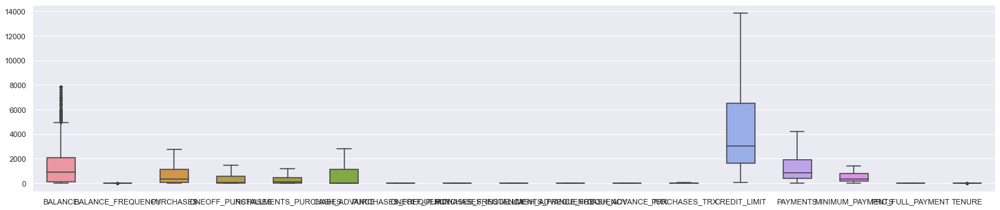

In [52]:
fig, ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data, width= 0.5,ax=ax,  fliersize=3)

### 1.3 Depuración de variables

Eliminamos la identificación del cliente para el análisis

In [ ]:
data = data.drop('CUST_ID' , axis=1)

### Escalamos los datos

La principal ventaja del escalado de datos es evitar los atributos en rangos numéricos mayores que dominan aquellos en rangos numéricos más pequeños.

In [ ]:
X_scaled = scale(data)
X_scaled.shape